# Image Super Resolution with CNN and Autoencoder

## 1 Setup


1.   Import libraries
2.   Setup runtime configure
3.   mount google drive



In [1]:
# import general libraries
import numpy as np
import pickle
import sys
import os
from tqdm import tqdm
from multiprocess import Pool
import random

# import libraries for plotting figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

# import image processing libraries
import cv2

# import sklearn libraries
from sklearn.model_selection import train_test_split

# import tensorflow and keras
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, Conv2D, MaxPool2D, UpSampling2D, Add, Input
from tensorflow.keras import regularizers
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.preprocessing import image
import tensorflow.keras.backend as K

# import libraries for google drive
from google.colab import drive

In [2]:
DATA_ROOT_DIR='/content/MyDrive/MyDrive/Dataset/coco'

drive.mount('/content/MyDrive')
sys.path.append(DATA_ROOT_DIR)

Mounted at /content/MyDrive


In [3]:
# constants
ORIGINAL_DIR = os.path.join(DATA_ROOT_DIR, 'val2017_500')
RESIZED_DIR = os.path.join(DATA_ROOT_DIR,'val2017_500_300_300')
#LOW_RES_DIR = os.path.join(DATA_ROOT_DIR,'val2017_low_res')
IMAGE_ARRAY_PICKLE_FILE = '/content/MyDrive/MyDrive/Colab Notebooks/Image Super Resolution/pickles/img_array.pickle'
MODEL_LOC = '/content/MyDrive/MyDrive/Colab Notebooks/Image Super Resolution/models/superResolution_checkpoint_newegg.h5'

## 2 Prepare Training Data


1.   Resize the image
2.   Create Image Array (with Normalization)
3.   Preserve the image Array
4.   Splitting the Data into Training Set and Validation Set
5.   Distort the image



### 2.1 Resize the image

In [4]:
ORIGINAL_FILENAMES = [os.path.join(ORIGINAL_DIR, fn) for fn in os.listdir(ORIGINAL_DIR)]
RESIZE_FILENAMES = [os.path.join(RESIZED_DIR, fn) for fn in os.listdir(ORIGINAL_DIR)]

print(len(ORIGINAL_FILENAMES))

DIMENSION = (300, 300)
progress_bar = tqdm(total=len(ORIGINAL_FILENAMES), position=0)

def resize(from_path, to_path):
    """resize the image to 300*300
    Args :
      from_path: original file path
      to_path: target file path
    """
    img = cv2.imread(from_path)
    img = cv2.resize(img, DIMENSION, interpolation=cv2.INTER_AREA)
    #if img.shape == (300, 300, 3):
    cv2.imwrite(to_path, img)
    #else:
    #    print('invalid image')
    progress_bar.update(1)

  0%|          | 0/500 [00:00<?, ?it/s]

500


In [5]:
#One time task
#p = Pool(1)
#_ = p.starmap(resize, zip(ORIGINAL_FILENAMES, RESIZE_FILENAMES))

### 2.2 Create Image Array (with Normalization)

In [6]:
progress_bar = tqdm(total=len(RESIZE_FILENAMES), position=0)

def load_image_normalize( file_path):
    """
    load image then normalize it
    Args:
        file_path : file path
    Return:
        image array
    """
    img = image.load_img(file_path)
    img = image.img_to_array(img)
    img = img / 255.
    progress_bar.update(1)
    return img

  0%|          | 0/500 [00:00<?, ?it/s]


In [7]:
# One time task
#p = Pool(1)
#img_array = p.map(load_image_normalize, RESIZE_FILENAMES)

### 2.3 Preserve the image Array

In [8]:
# One time task
#with open(IMAGE_ARRAY_PICKLE_FILE, 'wb') as f:
#   pickle.dump(img_array, f)

### 2.4 Splitting the Data into Training Set and Validation Set

In [9]:
with open (IMAGE_ARRAY_PICKLE_FILE, 'rb') as f:
    img_array = pickle.load(f)
  
all_images =  np.array(img_array)

#Split test and train data
train_x, val_x = train_test_split(all_images, random_state = 32, test_size=0.2)

### 2.5 Distort the image

1.   Generate blurry image through shrinking then expanding back to original size
2.   Add Noises
3.   Add GaussianBlur



In [10]:
# helper function

def noisy(noise_type,image):
    """
    add noise to image
    Args:
      image : ndarray Input image data. Will be converted to float.
      noise_type : str
          One of the following strings, selecting the type of noise to add:

      'gauss'     Gaussian-distributed additive noise.
      'poisson'   Poisson-distributed noise generated from the data.
      's&p'       Replaces random pixels with 0 or 1.
      'speckle'   Multiplicative noise using out = image + n*image,where
                      n is uniform noise with specified mean & variance.
  """
    if noise_type == "gauss":
        row,col,ch= image.shape
        mean = 0
        var = 0.1
        sigma = var**0.5
        gauss = np.random.normal(mean,sigma,(row,col,ch))
        gauss = gauss.reshape(row,col,ch)
        noisy = image + gauss
        return noisy
    elif noise_type == "sp":
        row,col,ch = image.shape
        s_vs_p = 0.5
        amount = 0.004
        out = np.copy(image)
        # Salt mode
        num_salt = np.ceil(amount * image.size * s_vs_p)
        coords = [np.random.randint(0, i - 1, int(num_salt))
              for i in image.shape]
        out[coords] = 1
        # Pepper mode
        num_pepper = np.ceil(amount* image.size * (1. - s_vs_p))
        coords = [np.random.randint(0, i - 1, int(num_pepper))
              for i in image.shape]
        out[coords] = 0
        return out
    elif noise_type == "poisson":
        vals = len(np.unique(image))
        vals = 2 ** np.ceil(np.log2(vals))
        noisy = np.random.poisson(image * vals) / float(vals)
        return noisy
    elif noise_type =="speckle":
        row,col,ch = image.shape
        gauss = np.random.randn(row,col,ch)
        gauss = gauss.reshape(row,col,ch)        
        noisy = image + image * gauss
        return noisy

In [11]:
noise_types = ['gauss','sp', 'poisson', 'speckle' ]
#noise_types = [ 'sp','poisson' ]
def pixalate_image(image, scale_percent=50):
    width = int(image.shape[1] * scale_percent / 100)
    height = int(image.shape[0] * scale_percent / 100)
    dim = (width, height)
    #adding blur
    idx = random.randint(0, 9)
    if(idx <=4):
        image = cv2.GaussianBlur(image, (9,9), 0)
    small_image = cv2.resize(image, dim, interpolation = cv2.INTER_AREA)

    # scale back to original size
    width = int(small_image.shape[1] * 100 / scale_percent)
    height = int(small_image.shape[0] * 100 / scale_percent)
    dim = (width, height)
   
    low_res_image = cv2.resize(small_image, dim, interpolation =  cv2.INTER_AREA)
    
    #adding noise
    #idx = random.randint(0, 9)
    idx = count %10
    if(idx <=4):    
        #idx = random.randint(0, len(noise_types)-1)
        idx = count % len(noise_types)
        noise_type =noise_types[idx]
        noise_image = noisy(noise_type, low_res_image)    
    else:
        noise_image = low_res_image
    return noise_image

In [12]:
# get low resolution images for training and validation set
count =0
train_x_px = []
for i in range(train_x.shape[0]):
    temp = pixalate_image(train_x[i,:,:,:])
    count +=1
    train_x_px.append(temp)

train_x_px = np.array(train_x_px) #Distorted images
count =0

val_x_px = []
for i in range(val_x.shape[0]):
   temp = pixalate_image(val_x[i,:,:,:])
   count +=1
   val_x_px.append(temp)
val_x_px = np.array(val_x_px)     #Distorted images

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:40: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


### 2.6 Display Sample Images

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


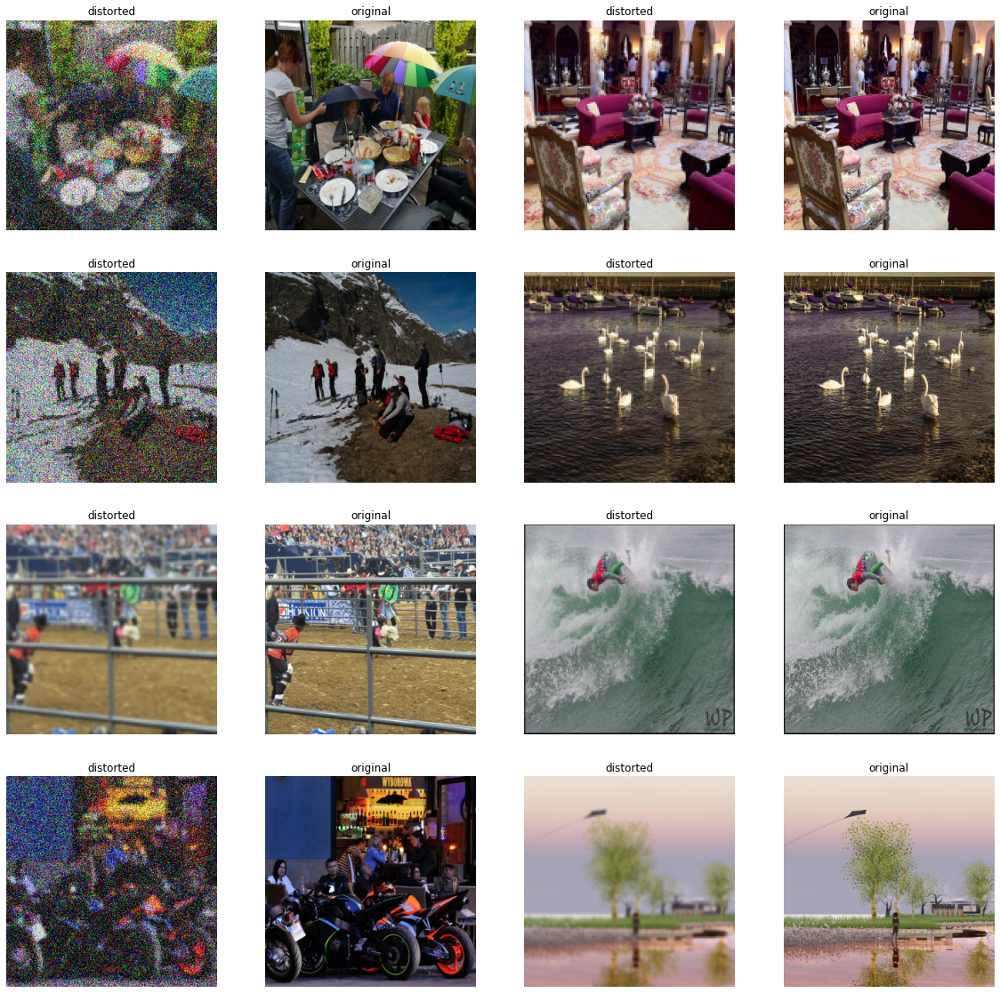

In [13]:
row_grid, col_grid = 4, 4
fig, axes = plt.subplots(row_grid, col_grid, figsize=(20, 20))

axes = axes.ravel()
for i in range(0, row_grid * col_grid, 2):
    index = i
    axes[i].imshow(train_x_px[i])
    axes[i+1].imshow(train_x[i])
    axes[i].axis('off')
    axes[i+1].axis('off')
    axes[i].set_title('distorted')
    axes[i+1].set_title('original')

## 3 Build the Model

In [14]:
# Denoise Autoencoder with Skip Connection
input＿img = Input(shape=(300, 300, 3))

#Encoder
x1 = Conv2D(64, (3, 3), activation='elu', padding='same', kernel_regularizer=regularizers.l1(10e-10) )(input＿img)
x2 = Conv2D(64, (3, 3), activation='elu', padding='same', kernel_regularizer=regularizers.l1(10e-10) )(x1)
x3 = MaxPool2D( pool_size=(2,2), padding='same')(x2)

x4 = Conv2D(128, (3, 3), activation='elu', padding='same', kernel_regularizer=regularizers.l1(10e-10) )(x3)
x5 = Conv2D(128, (3, 3), activation='elu', padding='same', kernel_regularizer=regularizers.l1(10e-10) )(x4)
x6 = MaxPool2D( pool_size=(2,2), padding='same')(x5)

encoded = Conv2D(256, (3, 3), activation='elu', padding='same', kernel_regularizer=regularizers.l1(10e-10))(x6)

#Decoder
x7 =  UpSampling2D()(encoded)
x8 = Conv2D(128, (3, 3), activation='elu', padding='same', kernel_regularizer=regularizers.l1(10e-10) )(x7)
x9 = Conv2D(128, (3, 3), activation='elu', padding='same', kernel_regularizer=regularizers.l1(10e-10) )(x8)
x10 = Add()([x5, x9])

x11 =  UpSampling2D()(x10)
x12 = Conv2D(64, (3, 3), activation='elu', padding='same', kernel_regularizer=regularizers.l1(10e-10) )(x11)
x13 = Conv2D(64, (3, 3), activation='elu', padding='same',kernel_regularizer=regularizers.l1(10e-10) )(x12)
x14 = Add()([x2, x13])

decoded = Conv2D(3, (3, 3),  activation='elu', padding='same', kernel_regularizer=regularizers.l1(10e-10))(x14)

autoencoder = Model(input_img, decoded)

In [15]:
autoencoder.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 300, 300, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 300, 300, 64) 1792        input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 300, 300, 64) 36928       conv2d[0][0]                     
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (None, 150, 150, 64) 0           conv2d_1[0][0]                   
______________________________________________________________________________________________

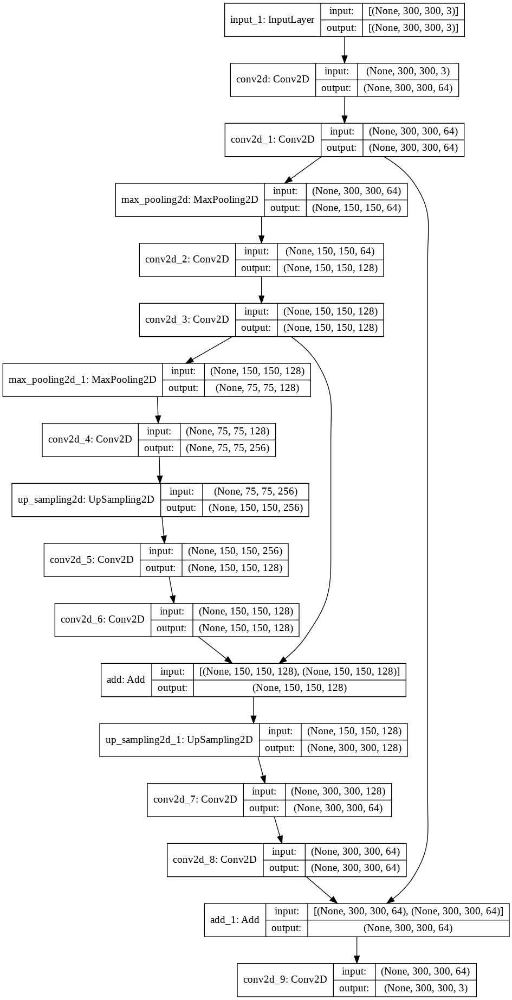

In [16]:
keras.utils.plot_model( autoencoder, show_shapes=True)

### We will use both MSE and Perceptual Loss as our loss function. We introduced content loss to alleviate the issue of generating perceptually unsatisfying results. In this way, we can capture not only the perceptual differences but also pixel differences.


In [17]:
from keras.applications.vgg16 import VGG16
mod = VGG16( include_top=False, weights='imagenet')
mod.trainable = False

for l in mod.layers:
  l.trainable = False

58892288/58889256 [==============================] - 1s 0us/step


In [18]:
def VGGLoss(y_true, y_pred):
    pred = K.concatenate([y_pred])
    true = K.concatenate([y_true])
    vggmodel = mod
    f_p = vggmodel(pred)
    f_t = vggmodel(true)
    return K.mean( K.square(f_p - f_t))

def MSE_Loss(y_true, y_pred):
    return K.mean(K.square(y_pred-y_true), axis=-1)

def total_Loss(y_true, y_pred):
    return VGGLoss(y_true, y_pred) + MSE_Loss(y_true, y_pred)

In [19]:
optimizer = keras.optimizers.Adam(beta_1=0.9, beta_2=0.999, epsilon=1e-07)
autoencoder.compile(optimizer=optimizer, loss=total_Loss, metrics=['accuracy'])

In [20]:
early_stopper = EarlyStopping(monitor='val_loss', min_delta=0.0001, patience=50, verbose=1, mode='min')
model_checkpoint =  ModelCheckpoint(MODEL_LOC, save_best_only = True)

def scheduler(epoch):
    lr = 0.
    if epoch < 30 : 
        lr = 0.001
    else:
        #lr = 0.001 * np.exp(0.1 * (10 - epoch))
        lr =  0.001 * np.exp(0.0070 * (10 - (epoch -20)))
    print("current running rate:", lr )
    return lr

lrscheduler = tf.keras.callbacks.LearningRateScheduler(scheduler)

In [21]:
# load model from previous check point
#autoencoder = keras.models.load_model(MODEL_LOC,  custom_objects={'total_Loss': total_Loss})#
#autoencoder.trainable =True
#for l in autoencoder.layers:
#  l.trainable = True

### 4 Trainig 

In [22]:
history = autoencoder.fit(train_x_px,train_x,
            batch_size=8,
            epochs=200,
            validation_data=(val_x_px, val_x),
            callbacks=[early_stopper, model_checkpoint, lrscheduler])

Epoch 1/200
current running rate: 0.001
50/50 [==============================] - 54s 384ms/step - loss: 1.2771 - accuracy: 0.3501 - val_loss: 0.1275 - val_accuracy: 0.5055
Epoch 2/200
current running rate: 0.001
50/50 [==============================] - 17s 347ms/step - loss: 0.1098 - accuracy: 0.5308 - val_loss: 0.0692 - val_accuracy: 0.7097
Epoch 3/200
current running rate: 0.001
50/50 [==============================] - 17s 347ms/step - loss: 0.0670 - accuracy: 0.6888 - val_loss: 0.0564 - val_accuracy: 0.7325
Epoch 4/200
current running rate: 0.001
50/50 [==============================] - 17s 348ms/step - loss: 0.0563 - accuracy: 0.7307 - val_loss: 0.0524 - val_accuracy: 0.7364
Epoch 5/200
current running rate: 0.001
50/50 [==============================] - 17s 347ms/step - loss: 0.0512 - accuracy: 0.7249 - val_loss: 0.0496 - val_accuracy: 0.7475
Epoch 6/200
current running rate: 0.001
50/50 [==============================] - 17s 348ms/step - loss: 0.0504 - accuracy: 0.7424 - val_loss

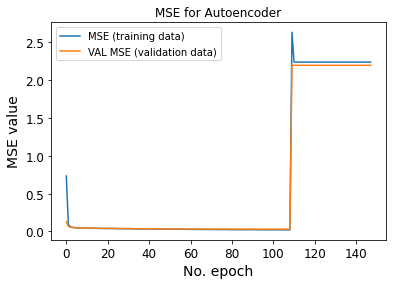

In [27]:
# Plot history: MSE
plt.plot(history.history['loss'], label='MSE (training data)')
plt.plot(history.history['val_loss'], label='VAL MSE (validation data)')
plt.title('MSE for Autoencoder')
plt.ylabel('MSE value')
plt.xlabel('No. epoch')
plt.legend(loc="upper left")
plt.show()

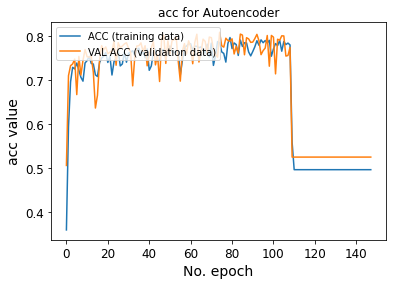

In [26]:
# Plot history: ACC
plt.plot(history.history['accuracy'], label='ACC (training data)')
plt.plot(history.history['val_accuracy'], label='VAL ACC (validation data)')
plt.title('acc for Autoencoder')
plt.ylabel('acc value')
plt.xlabel('No. epoch')
plt.legend(loc="upper left")
plt.show()

Sudden drop in learning rate. We could possibly faces 

1.   learning rate too high
2.   vanishing or exploding gradient
3.   Overfitting(less possible since train acc drops deeply as well)
 
I would try a different learning rate schedule like [FactorScheduler](https://github.com/apache/incubator-mxnet/blob/master/python/mxnet/lr_scheduler.py) It might  help us achieve more stable convergence by lowering the learning rate every few epochs





## 5 Check Result

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


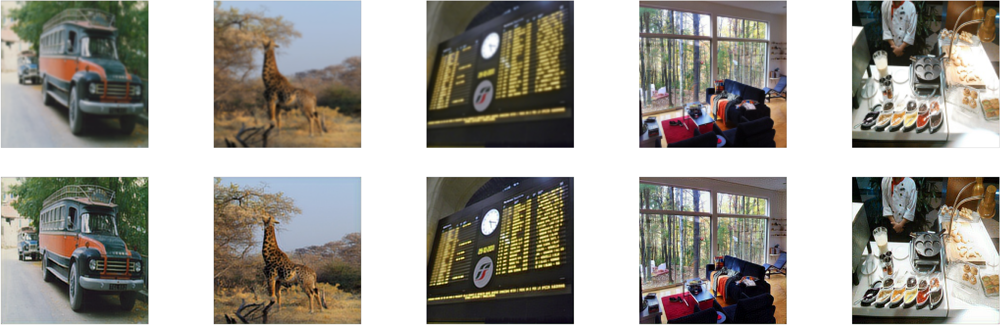

In [29]:
autoencoder = keras.models.load_model(MODEL_LOC,   custom_objects={'total_Loss': total_Loss})
predictions = autoencoder.predict(val_x_px[:20])

n = 5
plt.figure(figsize= (200,100))
for i in range(n):
  ax = plt.subplot(3, n, i+1)
  plt.imshow(val_x_px[i+5])
    
  ax.get_xaxis().set_visible(False)
  ax.get_yaxis().set_visible(False)
  ax = plt.subplot(3, n, i+1+n)
  plt.imshow(predictions[i+5])
  ax.get_xaxis().set_visible(False)
  ax.get_yaxis().set_visible(False)
plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


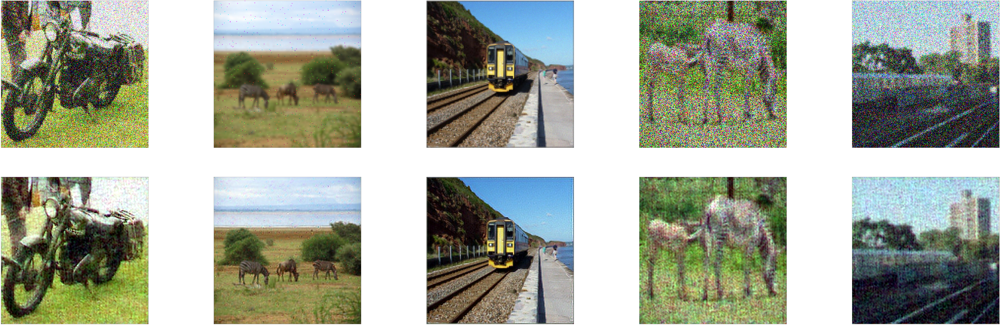

In [30]:
n = 5
plt.figure(figsize= (200,100))
for i in range(n):
  ax = plt.subplot(3, n, i+1)
  plt.imshow(val_x_px[i])
    
  ax.get_xaxis().set_visible(False)
  ax.get_yaxis().set_visible(False)
  ax = plt.subplot(3, n, i+1+n)
  plt.imshow(predictions[i])
  ax.get_xaxis().set_visible(False)
  ax.get_yaxis().set_visible(False)
plt.show()


The resolution indeed becomes better.
Currently, due to google colab resources, I have only use 500 training examples. More training example might be helpful.